In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly as py
import plotly.graph_objs as go
from sklearn.cluster import KMeans
import warnings
import ydata_profiling as pandas_profiling
warnings.filterwarnings("ignore")
py.offline.init_notebook_mode(connected = True)

In [2]:
file_path = '../data/base_prueba_tecnica.xlsx'
df = pd.read_excel(file_path)
df.head()

,ID,Edad,Genero,Ingresos Anuales,Gasto Mensual,Puntuación de Crédito,Región,Comportamiento en linea,Compras en el ultimo año
0,1,21,Masculino,222011,2297,335,Sur,8,81
1,2,26,Masculino,239229,3420,329,Oeste,10,27
2,3,38,Masculino,716278,36965,711,Oeste,9,82
3,4,64,Femenino,697325,9846,855,Sur,2,6
4,5,52,Femenino,1032569,6607,989,Sur,3,2


In [6]:
profiling=pandas_profiling.ProfileReport(df)
profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.shape

(3000, 9)

In [7]:
df.describe()

,ID,Edad,Ingresos Anuales,Gasto Mensual,Puntuación de Crédito,Comportamiento en linea,Compras en el ultimo año
count,3000.000000,3000.000000,3.000000e+03,3000.000000,3000.000000,3000.000000,3000.000000
mean,1500.500000,43.137000,7.458787e+05,17036.542667,641.390333,6.303667,58.933000
std,866.169729,16.239339,5.394438e+05,12741.646988,222.962069,3.272057,48.234967
min,1.000000,18.000000,1.000170e+05,1012.000000,300.000000,1.000000,1.000000
25%,750.750000,27.000000,2.324990e+05,4731.750000,435.000000,3.000000,8.000000
50%,1500.500000,46.000000,7.170055e+05,16474.000000,627.000000,8.000000,57.000000
75%,2250.250000,57.000000,1.109204e+06,26681.250000,848.000000,9.000000,98.000000
max,3000.000000,70.000000,1.998151e+06,44975.000000,999.000000,10.000000,150.000000


In [8]:
df.dtypes

ID                           int64
Edad                         int64
Genero                      object
Ingresos Anuales             int64
Gasto Mensual                int64
Puntuación de Crédito        int64
Región                      object
Comportamiento en linea      int64
Compras en el ultimo año     int64
dtype: object

In [9]:
df.isnull().sum()

ID                          0
Edad                        0
Genero                      0
Ingresos Anuales            0
Gasto Mensual               0
Puntuación de Crédito       0
Región                      0
Comportamiento en linea     0
Compras en el ultimo año    0
dtype: int64

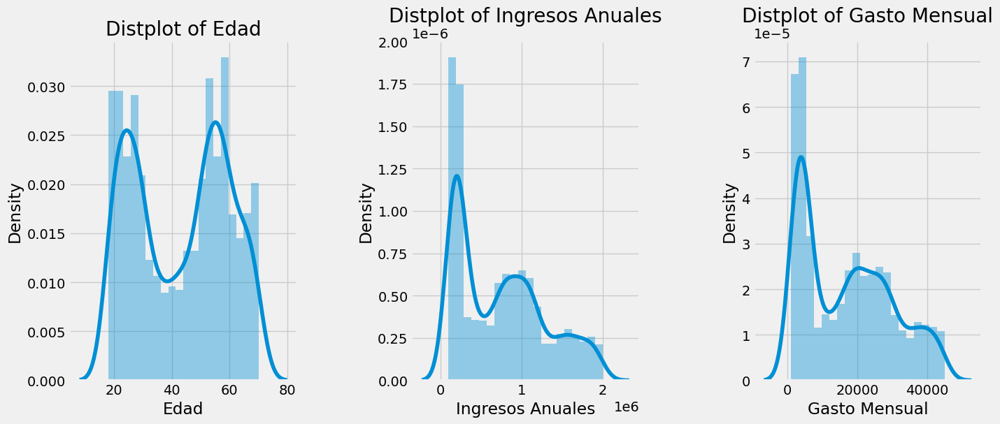

In [11]:
plt.style.use('fivethirtyeight')
plt.figure(1 , figsize = (15 , 6))
n = 0 
for x in ['Edad' , 'Ingresos Anuales' , 'Gasto Mensual']:
    n += 1
    plt.subplot(1 , 3 , n)
    plt.subplots_adjust(hspace =0.5 , wspace = 0.5)
    sns.distplot(df[x] , bins = 20)
    plt.title('Distplot of {}'.format(x))
plt.show()

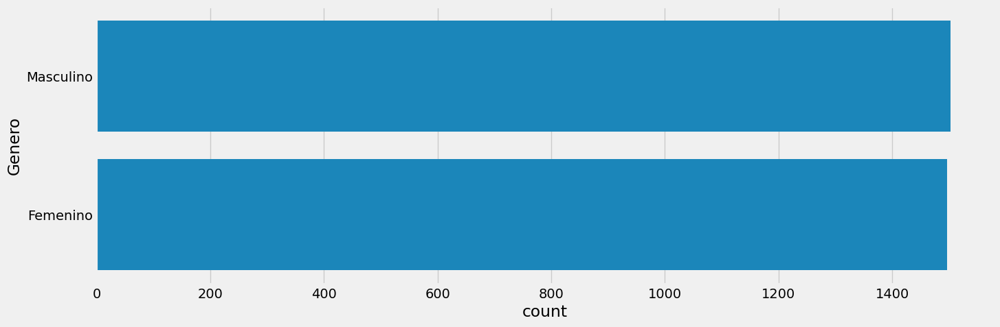

In [13]:
plt.figure(1 , figsize = (15 , 5))
sns.countplot(y = 'Genero' , data = df)
plt.show()

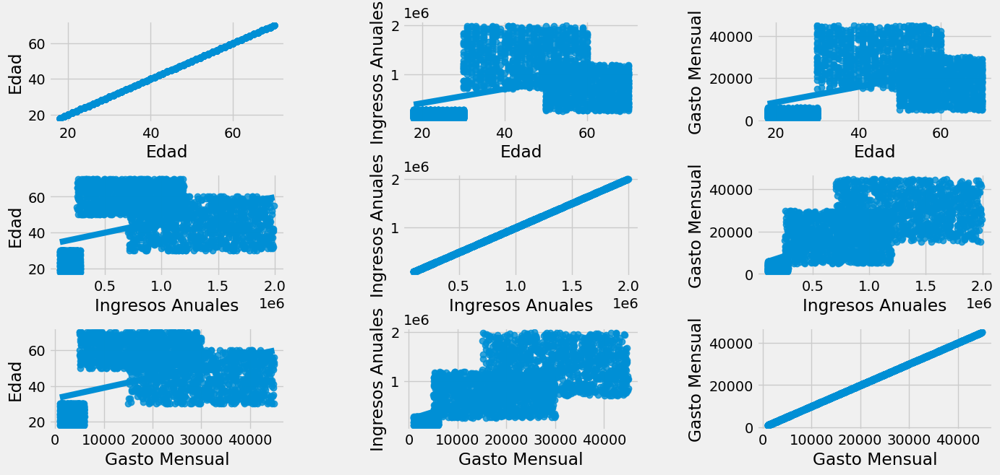

In [14]:
plt.figure(1 , figsize = (15 , 7))
n = 0 
for x in ['Edad' , 'Ingresos Anuales' , 'Gasto Mensual']:
    for y in ['Edad' , 'Ingresos Anuales' , 'Gasto Mensual']:
        n += 1
        plt.subplot(3 , 3 , n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
        sns.regplot(x = x , y = y , data = df)
        plt.ylabel(y.split()[0]+' '+y.split()[1] if len(y.split()) > 1 else y )
plt.show()

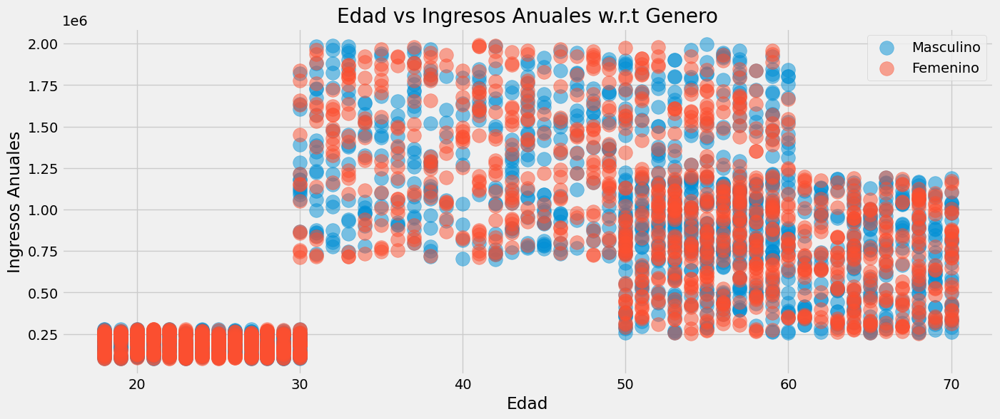

In [16]:
plt.figure(1 , figsize = (15 , 6))
for Genero in ['Masculino' , 'Femenino']:
    plt.scatter(x = 'Edad' , y = 'Ingresos Anuales' , data = df[df['Genero'] == Genero] ,
                s = 200 , alpha = 0.5 , label = Genero)
plt.xlabel('Edad'), plt.ylabel('Ingresos Anuales') 
plt.title('Edad vs Ingresos Anuales w.r.t Genero')
plt.legend()
plt.show()

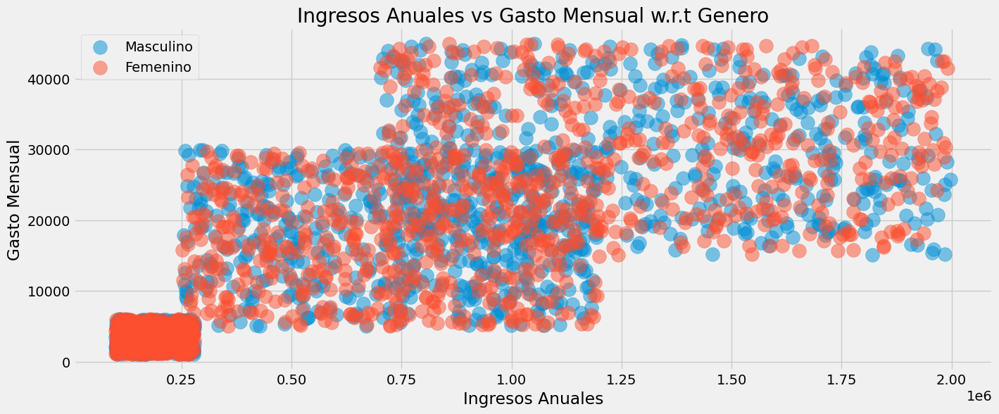

In [18]:
plt.figure(1 , figsize = (15 , 6))
for Genero in ['Masculino' , 'Femenino']:
    plt.scatter(x = 'Ingresos Anuales',y = 'Gasto Mensual' ,
                data = df[df['Genero'] == Genero] ,s = 200 , alpha = 0.5 , label = Genero)
plt.xlabel('Ingresos Anuales'), plt.ylabel('Gasto Mensual') 
plt.title('Ingresos Anuales vs Gasto Mensual w.r.t Genero')
plt.legend()
plt.show()

In [67]:
df.head()

,ID,Edad,Genero,Ingresos Anuales,Gasto Mensual,Puntuación de Crédito,Región,Comportamiento en linea,Compras en el ultimo año
0,1,21,Masculino,222011,2297,335,Sur,8,81
1,2,26,Masculino,239229,3420,329,Oeste,10,27
2,3,38,Masculino,716278,36965,711,Oeste,9,82
3,4,64,Femenino,697325,9846,855,Sur,2,6
4,5,52,Femenino,1032569,6607,989,Sur,3,2


### Clustering using K- means

In [4]:
'''Age and spending Score'''
X1 = df[['Edad' , 'Gasto Mensual']].iloc[: , :].values
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
    algorithm.fit(X1)
    inertia.append(algorithm.inertia_)

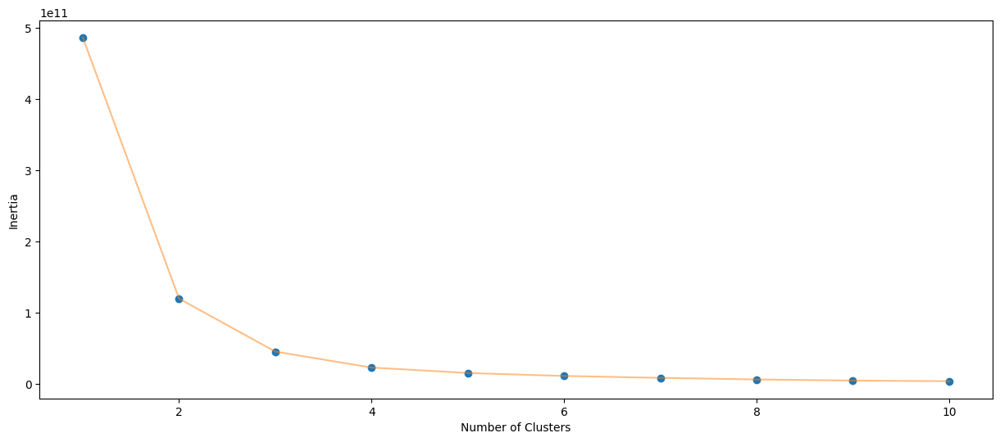

In [5]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [14]:
algorithm = (KMeans(n_clusters = 2 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
algorithm.fit(X1)
labels1 = algorithm.labels_
centroids1 = algorithm.cluster_centers_

In [15]:
h = 0.15
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = algorithm.predict(np.c_[xx.ravel(), yy.ravel()]) 

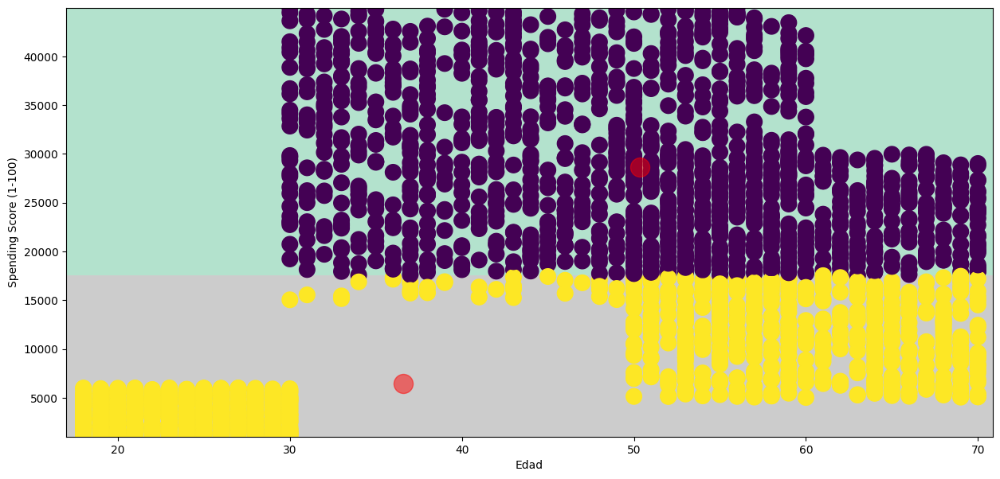

In [16]:
plt.figure(1 , figsize = (15 , 7) )
plt.clf()
Z = Z.reshape(xx.shape)
plt.imshow(Z , interpolation='nearest', 
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel2, aspect = 'auto', origin='lower')

plt.scatter( x = 'Edad' ,y = 'Gasto Mensual' , data = df , c = labels1 , 
            s = 200 )
plt.scatter(x = centroids1[: , 0] , y =  centroids1[: , 1] , s = 300 , c = 'red' , alpha = 0.5)
plt.ylabel('Spending Score (1-100)') , plt.xlabel('Edad')
plt.show()

In [3]:
'''Annual Income and spending Score'''
X2 = df[['Ingresos Anuales' , 'Gasto Mensual']].iloc[: , :].values
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
    algorithm.fit(X2)
    inertia.append(algorithm.inertia_)

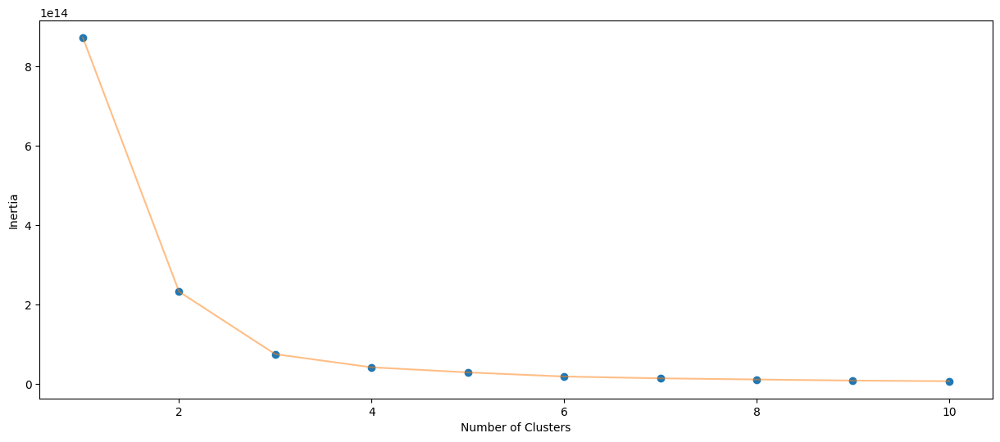

In [4]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [12]:
algorithm = (KMeans(n_clusters = 3 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
algorithm.fit(X2)
labels2 = algorithm.labels_
centroids2 = algorithm.cluster_centers_

In [13]:
h =30
x_min, x_max = X2[:, 0].min() - 1, X2[:, 0].max() + 1
y_min, y_max = X2[:, 1].min() - 1, X2[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z2 = algorithm.predict(np.c_[xx.ravel(), yy.ravel()]) 

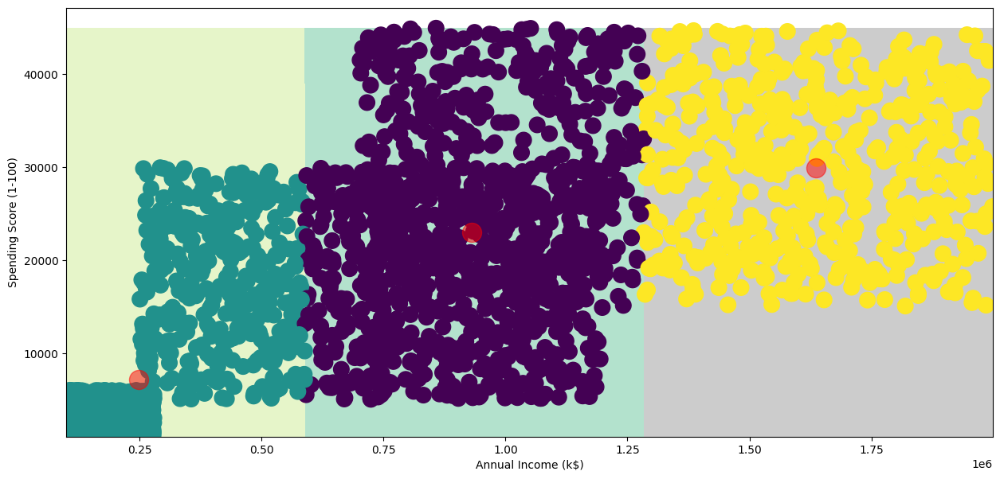

In [14]:
plt.figure(1 , figsize = (15 , 7) )
plt.clf()
Z2 = Z2.reshape(xx.shape)
plt.imshow(Z2 , interpolation='nearest', 
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel2, aspect = 'auto', origin='lower')

plt.scatter( x = 'Ingresos Anuales' ,y = 'Gasto Mensual' , data = df , c = labels2 , 
            s = 200 )
plt.scatter(x = centroids2[: , 0] , y =  centroids2[: , 1] , s = 300 , c = 'red' , alpha = 0.5)
plt.ylabel('Spending Score (1-100)') , plt.xlabel('Annual Income (k$)')
plt.show()

In [15]:
X3 = df[['Edad' , 'Ingresos Anuales' ,'Gasto Mensual']].iloc[: , :].values
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
    algorithm.fit(X3)
    inertia.append(algorithm.inertia_)

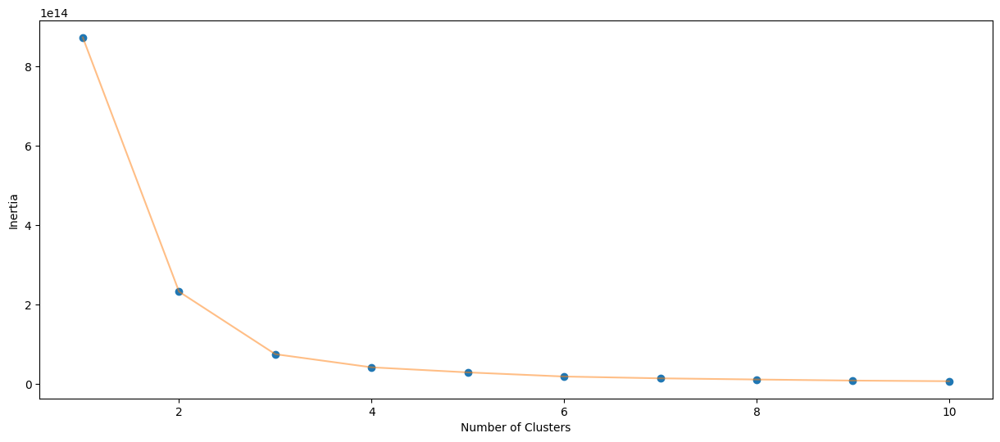

In [16]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [17]:
algorithm = (KMeans(n_clusters = 4 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
algorithm.fit(X3)
labels3 = algorithm.labels_
centroids3 = algorithm.cluster_centers_

In [22]:
df['label3'] =  labels3
trace1 = go.Scatter3d(
    x= df['Edad'],
    y= df['Gasto Mensual'],
    z= df['Ingresos Anuales'],
    mode='markers',
     marker=dict(
        color = df['label3'], 
        size= 20,
        line=dict(
            color= df['label3'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Edad'),
            yaxis = dict(title  = 'Gasto Mensual'),
            zaxis = dict(title  = 'Annual Income')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [12]:
%matplotlib inline


# Segunda inspiración


In [15]:
file_path = '../data/base_prueba_tecnica.xlsx'
df = pd.read_excel(file_path)
df.head()

,ID,Edad,Genero,Ingresos Anuales,Gasto Mensual,Puntuación de Crédito,Región,Comportamiento en linea,Compras en el ultimo año
0,1,21,Masculino,222011,2297,335,Sur,8,81
1,2,26,Masculino,239229,3420,329,Oeste,10,27
2,3,38,Masculino,716278,36965,711,Oeste,9,82
3,4,64,Femenino,697325,9846,855,Sur,2,6
4,5,52,Femenino,1032569,6607,989,Sur,3,2


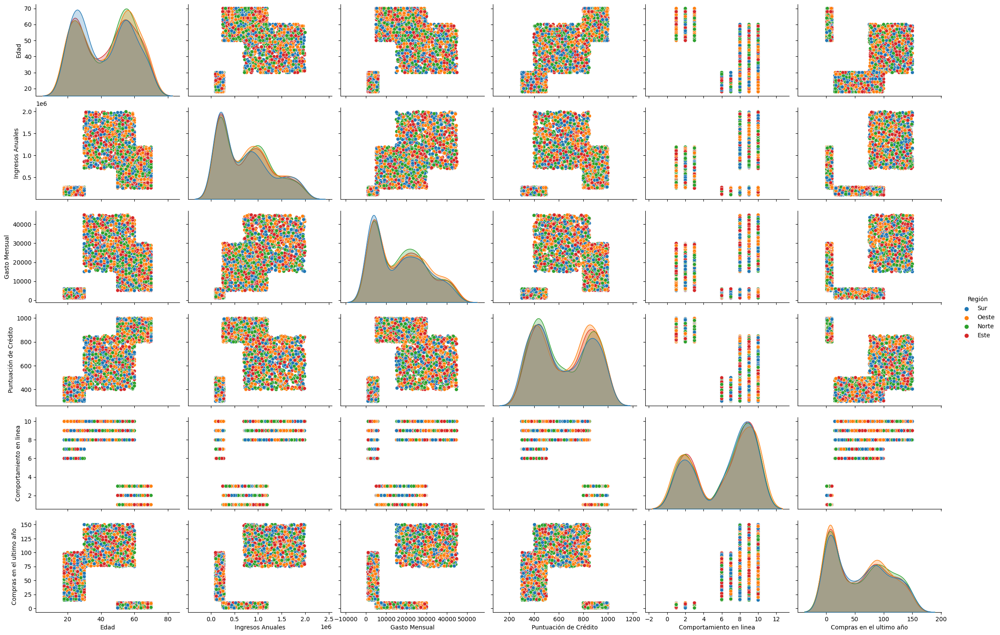

In [18]:
X = df.drop(['ID', 'Región'], axis=1)  # Asumiendo que quieres eliminar 'ID' y 'Región' de X
sns.pairplot(df.drop('ID', axis=1), hue='Región', aspect=1.5)  # Usar 'Región' para el coloreado
plt.show()



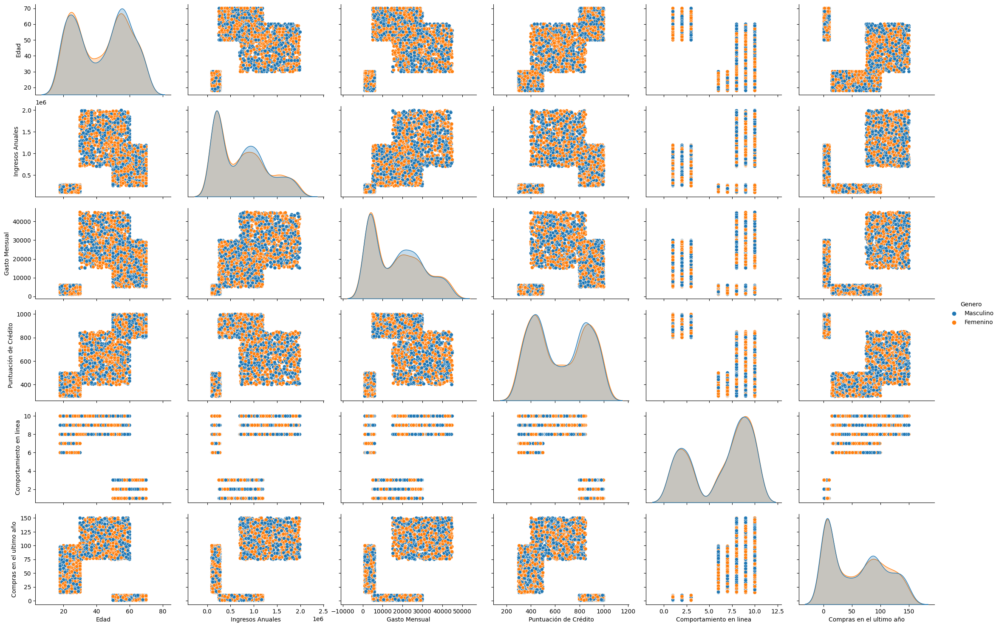

In [19]:
X = df.drop(['ID', 'Genero'], axis=1)
sns.pairplot(df.drop('ID', axis=1), hue='Genero', aspect=1.5)
plt.show()

# Tercera inspiración

There is one binary, categorical column: Genero. You may be tempted to one-hot encode it for the clustering. It is:

* technically possible
* theoretically not forbidden
* practically not recommended
However, it is not recommended and nicely explained on the IBM support site. (https://www.ibm.com/support/pEdads/clustering-binary-data-k-means-should-be-avoided)

In [31]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

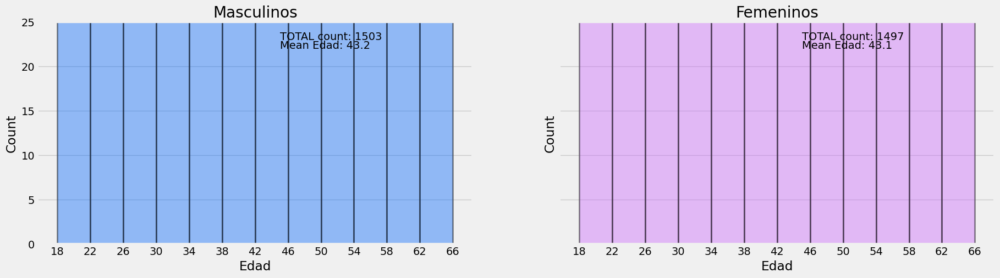

In [29]:
Masculinos_Edad = df[df['Genero']=='Masculino']['Edad'] # subset with Masculinos Edad
Femeninos_Edad = df[df['Genero']=='Femenino']['Edad'] # subset with Femeninos Edad

Edad_bins = range(18,70,4)

# Masculinos histogram
fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5), sharey=True)
sns.distplot(Masculinos_Edad, bins=Edad_bins, kde=False, color='#0066ff', ax=ax1, hist_kws=dict(edgecolor="k", linewidth=2))
ax1.set_xticks(Edad_bins)
ax1.set_ylim(top=25)
ax1.set_title('Masculinos')
ax1.set_ylabel('Count')
ax1.text(45,23, "TOTAL count: {}".format(Masculinos_Edad.count()))
ax1.text(45,22, "Mean Edad: {:.1f}".format(Masculinos_Edad.mean()))

# Femeninos histogram
sns.distplot(Femeninos_Edad, bins=Edad_bins, kde=False, color='#cc66ff', ax=ax2, hist_kws=dict(edgecolor="k", linewidth=2))
ax2.set_xticks(Edad_bins)
ax2.set_title('Femeninos')
ax2.set_ylabel('Count')
ax2.text(45,23, "TOTAL count: {}".format(Femeninos_Edad.count()))
ax2.text(45,22, "Mean Edad: {:.1f}".format(Femeninos_Edad.mean()))

plt.show()

In [33]:
print('Kolgomorov-Smirnov test p-value: {:.2f}'.format(stats.ks_2samp(Masculinos_Edad, Femeninos_Edad)[1]))

Kolgomorov-Smirnov test p-value: 0.94


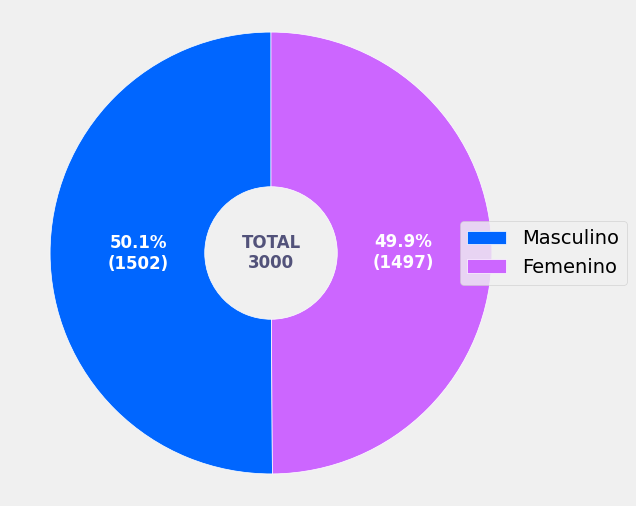

In [34]:
def labeler(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)

sizes = [Masculinos_Edad.count(),Femeninos_Edad.count()] # wedge sizes

fig0, ax1 = plt.subplots(figsize=(6,6))
wedges, texts, autotexts = ax1.pie(sizes,
                                   autopct=lambda pct: labeler(pct, sizes),
                                   radius=1,
                                   colors=['#0066ff','#cc66ff'],
                                   startangle=90,
                                   textprops=dict(color="w"),
                                   wedgeprops=dict(width=0.7, edgecolor='w'))

ax1.legend(wedges, ['Masculino','Femenino'],
           loc='center right',
           bbox_to_anchor=(0.7, 0, 0.5, 1))

plt.text(0,0, 'TOTAL\n{}'.format(df['Edad'].count()),
         weight='bold', size=12, color='#52527a',
         ha='center', va='center')

plt.setp(autotexts, size=12, weight='bold')
ax1.axis('equal')  # Equal aspect ratio
plt.show()

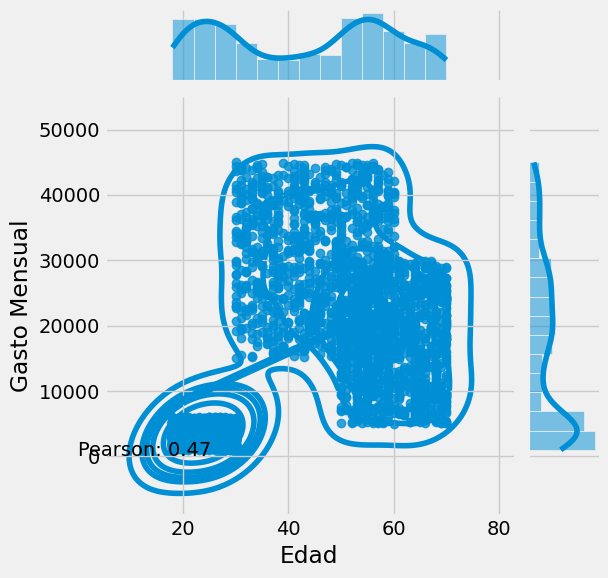

In [44]:
from scipy.stats import pearsonr

# calculating Pearson's correlation
corr, _ = pearsonr(df['Edad'], df['Gasto Mensual'])

jp = sns.jointplot(x='Edad', y='Gasto Mensual', data=df, kind='reg').plot_joint(sns.kdeplot, zorder=0, n_levels=6)


plt.text(0,120, 'Pearson: {:.2f}'.format(corr))
plt.show()

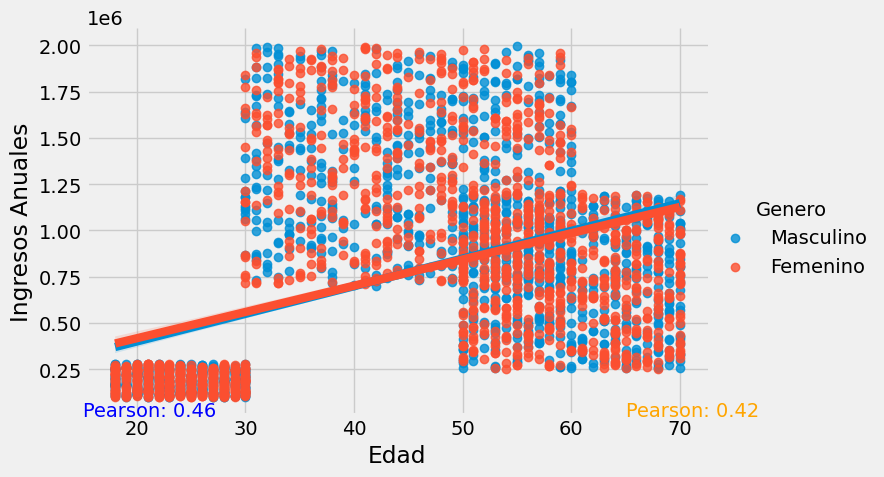

In [50]:
males_age = df[df['Genero']=='Masculino']['Edad'] # subset with males age
females_age = df[df['Genero']=='Femenino']['Edad'] # subset with females age
males_spending = df[df['Genero']=='Masculino']['Gasto Mensual'] # subset with males age
females_spending = df[df['Genero']=='Femenino']['Gasto Mensual'] # subset with females age
males_income = df[df['Genero']=='Masculino']['Ingresos Anuales'] # subset with males income
females_income = df[df['Genero']=='Femenino']['Ingresos Anuales'] # subset with females income

# calculating Pearson's correlations
corr1, _ = pearsonr(males_age.values, males_income.values)
corr2, _ = pearsonr(females_age.values, females_income.values)

sns.lmplot(x = 'Edad', y ='Ingresos Anuales', data=df, hue='Genero',
          aspect=1.5)

plt.text(15,87, 'Pearson: {:.2f}'.format(corr1), color='blue')
plt.text(65,80, 'Pearson: {:.2f}'.format(corr2), color='orange')

plt.show()

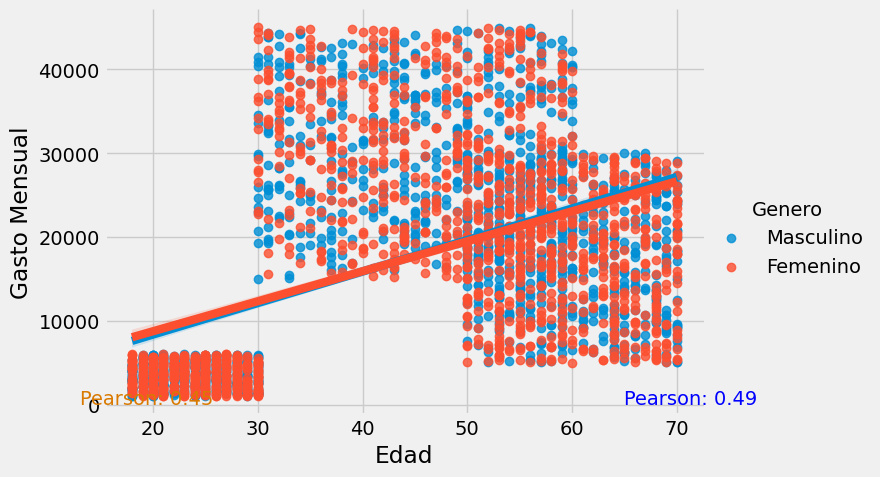

In [53]:
# calculating Pearson's correlations
corr1, _ = pearsonr(males_age.values, males_spending.values)
corr2, _ = pearsonr(females_age.values, females_spending.values)

sns.lmplot(x ='Edad', y ='Gasto Mensual', data=df, hue='Genero',
          aspect=1.5)

plt.text(65,65, 'Pearson: {:.2f}'.format(corr1), color='blue')
plt.text(13,83, 'Pearson: {:.2f}'.format(corr2), color='#d97900')

plt.show()

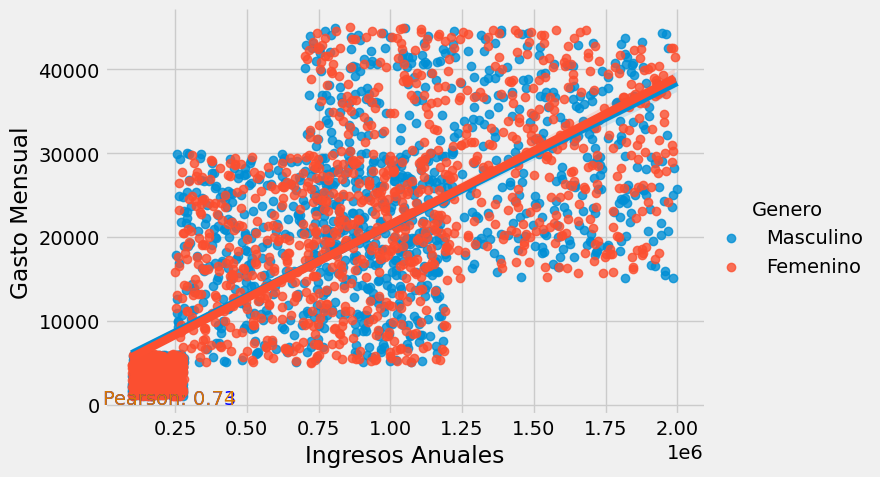

In [55]:
# calculating Pearson's correlations
corr1, _ = pearsonr(males_income.values, males_spending.values)
corr2, _ = pearsonr(females_income.values, females_spending.values)

sns.lmplot(x ='Ingresos Anuales',y = 'Gasto Mensual', data=df, hue='Genero',
          aspect=1.5)

plt.text(130,23, 'Pearson: {:.2f}'.format(corr1), color='blue')
plt.text(130,77, 'Pearson: {:.2f}'.format(corr2), color='#d97900')

plt.show()

In [47]:
df.describe()

,ID,Edad,Ingresos Anuales,Gasto Mensual,Puntuación de Crédito,Comportamiento en linea,Compras en el ultimo año
count,3000.000000,3000.000000,3.000000e+03,3000.000000,3000.000000,3000.000000,3000.000000
mean,1500.500000,43.137000,7.458787e+05,17036.542667,641.390333,6.303667,58.933000
std,866.169729,16.239339,5.394438e+05,12741.646988,222.962069,3.272057,48.234967
min,1.000000,18.000000,1.000170e+05,1012.000000,300.000000,1.000000,1.000000
25%,750.750000,27.000000,2.324990e+05,4731.750000,435.000000,3.000000,8.000000
50%,1500.500000,46.000000,7.170055e+05,16474.000000,627.000000,8.000000,57.000000
75%,2250.250000,57.000000,1.109204e+06,26681.250000,848.000000,9.000000,98.000000
max,3000.000000,70.000000,1.998151e+06,44975.000000,999.000000,10.000000,150.000000


In [3]:
df['Genero'] = df['Genero'].replace({'Masculino': 1, 'Femenino': 0})

columnas_seleccionadas = ['Edad', 'Ingresos Anuales', 'Gasto Mensual','Puntuación de Crédito',	'Comportamiento en linea',	'Compras en el ultimo año']

# Calculamos la correlación solo para las columnas seleccionadas
correlacion = df[columnas_seleccionadas].corr()

print(correlacion)


                              Edad  Ingresos Anuales  Gasto Mensual  \
Edad                      1.000000          0.438571       0.467588   
Ingresos Anuales          0.438571          1.000000       0.734275   
Gasto Mensual             0.467588          0.734275       1.000000   
Puntuación de Crédito     0.826753          0.346943       0.374231   
Comportamiento en linea  -0.623042          0.134922       0.090453   
Compras en el ultimo año -0.311414          0.436229       0.401099   

                          Puntuación de Crédito  Comportamiento en linea  \
Edad                                   0.826753                -0.623042   
Ingresos Anuales                       0.346943                 0.134922   
Gasto Mensual                          0.374231                 0.090453   
Puntuación de Crédito                  1.000000                -0.723811   
Comportamiento en linea               -0.723811                 1.000000   
Compras en el ultimo año              -0.43851

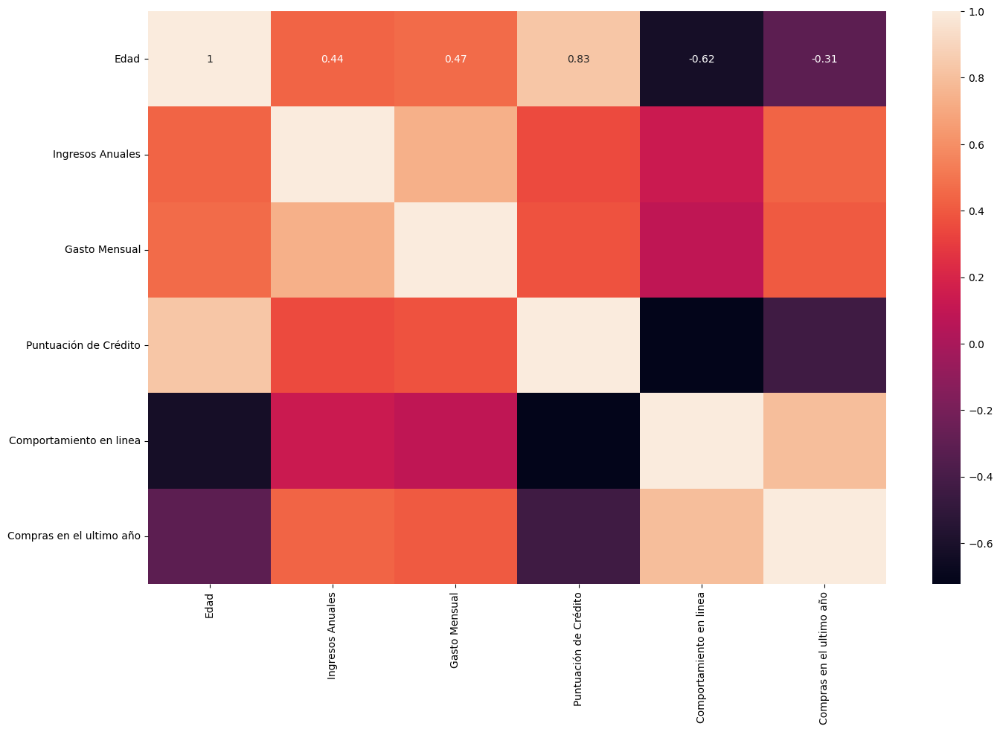

In [8]:
plt.figure(figsize=(16, 10))

sns.heatmap(correlacion, annot=True)

plt.show()